In [1]:
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

[`geopandas`](https://geopandas.org/en/stable/getting_started/introduction.html) is a package that extends `pandas` to handle geospatial data. It adds a new data type, `geometry` and methods to handle geospatial data.

### Reading and writing

`geopandas` can read and write data in typical geospatial data formats, like shapefiles (.shp) and geojson

In [2]:
# fishing_sites = gpd.read_file('https://services5.arcgis.com/GfwWNkhOj9bNBqoJ/arcgis/rest/services/nywpaa_saltwaterfishingsites/FeatureServer/0/query?where=1=1&outFields=*&outSR=4326&f=pgeojson')
fishing_sites = gpd.read_file('../Data/Source Data/fishing_sites.geojson')

In [3]:
fishing_sites.head()

,OBJECTID,Site,Ownership,Link,GlobalID,geometry
0,1,Roberto Clemente Park,NYS,https://www.dec.ny.gov/outdoor/8377.html,ee669a47-d0be-40c7-86ff-7a726ab03e95,POINT (-73.92134 40.85471)
1,2,Tiffany St. Pier,NYC Parks,https://www.dec.ny.gov/outdoor/8377.html,5ad7eea3-1160-4a70-9bf1-34b496e940de,POINT (-73.88984 40.80523)
2,3,Hunt's Point Landing,NYC Parks,https://www.dec.ny.gov/outdoor/8377.html,c3e7d944-edf0-4891-a952-4327a0e831e1,POINT (-73.87138 40.80205)
3,4,Soundview Park,NYC Parks,https://www.dec.ny.gov/outdoor/8377.html,b3a66d63-5076-416b-955d-82d629a15c29,POINT (-73.86751 40.81079)
4,5,Hunt's Point Riverside Park,NYC Parks,https://www.dec.ny.gov/outdoor/8377.html,f746d2d5-1b81-4f94-b12a-92e8cbf0b40f,POINT (-73.88127 40.81798)


Read a shapefile by pointing to the _folder_ containing all the components (or a .zip folder if it contains only the shapefile components)

In [5]:
# download from https://s-media.nyc.gov/agencies/dcp/assets/files/zip/data-tools/bytes/police-precincts/nypp_25a.zip
gpd.read_file('../Data/Source Data/nypp_25a')

,Precinct,Shape_Leng,Shape_Area,geometry
0,1,80093.490310,4.728475e+07,"MULTIPOLYGON (((972081.788 190733.467, 972184...."
1,5,18807.080607,1.809477e+07,"POLYGON ((987399.207 202660.992, 987385.83 202..."
2,6,27255.991120,2.214302e+07,"POLYGON ((981714.03 209792.184, 981770.123 209..."
3,7,17287.655061,1.836663e+07,"POLYGON ((991608.135 201215.298, 991575.973 20..."
4,9,19772.510741,2.139539e+07,"POLYGON ((992119.124 204042.761, 992114.154 20..."
...,...,...,...,...
73,116,73462.653090,1.644177e+08,"POLYGON ((1060282.018 188318.545, 1060270.492 ..."
74,120,92949.901858,2.323334e+08,"POLYGON ((969375.294 159223.846, 969236.215 15..."
75,121,136811.464647,4.755776e+08,"MULTIPOLYGON (((939997.095 173013.579, 939915...."
76,122,154846.589526,4.548466e+08,"MULTIPOLYGON (((970217.022 145643.332, 970227...."


or pointing to the _.shp_ file: 

In [6]:
gpd.read_file('../Data/Source Data/nypp_25a/nypp.shp')

,Precinct,Shape_Leng,Shape_Area,geometry
0,1,80093.490310,4.728475e+07,"MULTIPOLYGON (((972081.788 190733.467, 972184...."
1,5,18807.080607,1.809477e+07,"POLYGON ((987399.207 202660.992, 987385.83 202..."
2,6,27255.991120,2.214302e+07,"POLYGON ((981714.03 209792.184, 981770.123 209..."
3,7,17287.655061,1.836663e+07,"POLYGON ((991608.135 201215.298, 991575.973 20..."
4,9,19772.510741,2.139539e+07,"POLYGON ((992119.124 204042.761, 992114.154 20..."
...,...,...,...,...
73,116,73462.653090,1.644177e+08,"POLYGON ((1060282.018 188318.545, 1060270.492 ..."
74,120,92949.901858,2.323334e+08,"POLYGON ((969375.294 159223.846, 969236.215 15..."
75,121,136811.464647,4.755776e+08,"MULTIPOLYGON (((939997.095 173013.579, 939915...."
76,122,154846.589526,4.548466e+08,"MULTIPOLYGON (((970217.022 145643.332, 970227...."


Line geometries:

In [7]:
bike_lanes = gpd.read_file('https://data.cityofnewyork.us/resource/mzxg-pwib.geojson')

In [8]:
bike_lanes.head()

,bikedir,fromstreet,lanecount,facilitycl,ft2facilit,tf2facilit,tostreet,ret_date,bikeid,instdate,...,allclasses,version,onoffst,status,ft_facilit,boro,street,segmentid,prevbikeid,geometry
0,2,HOLTEN AV,2,II,None,None,LUTEN AV,NaT,6562.0,2007-10-01,...,II,23c,ON,Current,Curbside,5,HYLAN BLVD,2579.0,NA,"MULTILINESTRING ((-74.19243 40.52174, -74.1951..."
1,2,RICHMOND HILL RD,2,II,None,None,ROCKLAND AV,NaT,4272.0,2021-08-12,...,II,23c,ON,Current,Buffered,5,MERRYMOUNT ST,5033.0,None,"MULTILINESTRING ((-74.16031 40.58903, -74.1612..."
2,2,RICHMOND TERR,2,III,None,None,FOREST AVE,NaT,2107.0,2015-09-11,...,III,23c,ON,Current,Sharrows,5,CLOVE ROAD,10186.0,NA,"MULTILINESTRING ((-74.12632 40.63525, -74.1259..."
3,2,23 ST,2,III,None,None,50 ST,NaT,942.0,2013-07-02,...,III,23c,ON,Current,Sharrows,3,5 AV,20716.0,NA,"MULTILINESTRING ((-74.00974 40.64567, -74.0103..."
4,2,67 ST,2,III,None,None,FT HAMILTON PKWY,NaT,951.0,2015-06-29,...,III,23c,ON,Current,Sharrows,3,6 AVENUE,126857.0,NA,"MULTILINESTRING ((-74.02089 40.62654, -74.0209..."


Polygon geometries:

In [9]:
neighborhood_tabulation_areas = gpd.read_file('https://services5.arcgis.com/GfwWNkhOj9bNBqoJ/arcgis/rest/services/NYC_Neighborhood_Tabulation_Areas_2020/FeatureServer/0/query?where=1=1&outFields=*&outSR=4326&f=pgeojson')

In [10]:
neighborhood_tabulation_areas.head()

,OBJECTID,BoroCode,BoroName,CountyFIPS,NTA2020,NTAName,NTAAbbrev,NTAType,CDTA2020,CDTAName,Shape__Area,Shape__Length,geometry
0,1,3,Brooklyn,047,BK0101,Greenpoint,Grnpt,0,BK01,BK01 Williamsburg-Greenpoint (CD 1 Equivalent),3.532181e+07,28919.562151,"POLYGON ((-73.93214 40.72817, -73.93238 40.728..."
1,2,3,Brooklyn,047,BK0102,Williamsburg,Wllmsbrg,0,BK01,BK01 Williamsburg-Greenpoint (CD 1 Equivalent),2.885431e+07,28098.026805,"POLYGON ((-73.95814 40.72441, -73.95772 40.724..."
2,3,3,Brooklyn,047,BK0103,South Williamsburg,SWllmsbrg,0,BK01,BK01 Williamsburg-Greenpoint (CD 1 Equivalent),1.520896e+07,18250.280306,"POLYGON ((-73.95024 40.70548, -73.94984 40.705..."
3,4,3,Brooklyn,047,BK0104,East Williamsburg,EWllmsbrg,0,BK01,BK01 Williamsburg-Greenpoint (CD 1 Equivalent),5.226741e+07,43184.799309,"POLYGON ((-73.92406 40.71412, -73.92404 40.714..."
4,5,3,Brooklyn,047,BK0201,Brooklyn Heights,BkHts,0,BK02,BK02 Downtown Brooklyn-Fort Greene (CD 2 Appro...,9.982321e+06,14312.505244,"POLYGON ((-73.99237 40.6897, -73.99436 40.6902..."


`geopandas` `GeoDataFrame`s can be manipulated just like other `pandas` `DataFrame`s

In [11]:
(
    fishing_sites
    ['Ownership']
    .value_counts()
)

Ownership
NYC Parks      43
City           31
NPS            11
HRPT            4
State Parks     4
Private         2
BBP             2
BPCA            2
NYSDEC          2
NYS             1
Co-op City      1
Ikea Co.        1
NYRP            1
Costco          1
NYCHA           1
Name: count, dtype: int64

In [12]:
(
    fishing_sites
    [
        fishing_sites['Ownership'] == 'NYC Parks'
    ]
)

,OBJECTID,Site,Ownership,Link,GlobalID,geometry
1,2,Tiffany St. Pier,NYC Parks,https://www.dec.ny.gov/outdoor/8377.html,5ad7eea3-1160-4a70-9bf1-34b496e940de,POINT (-73.88984 40.80523)
2,3,Hunt's Point Landing,NYC Parks,https://www.dec.ny.gov/outdoor/8377.html,c3e7d944-edf0-4891-a952-4327a0e831e1,POINT (-73.87138 40.80205)
3,4,Soundview Park,NYC Parks,https://www.dec.ny.gov/outdoor/8377.html,b3a66d63-5076-416b-955d-82d629a15c29,POINT (-73.86751 40.81079)
4,5,Hunt's Point Riverside Park,NYC Parks,https://www.dec.ny.gov/outdoor/8377.html,f746d2d5-1b81-4f94-b12a-92e8cbf0b40f,POINT (-73.88127 40.81798)
5,6,Concrete Plant Park,NYC Parks,https://www.dec.ny.gov/outdoor/8377.html,4261eff4-bfa5-4b46-9b78-bd333d7d9078,POINT (-73.88494 40.82504)
6,7,Starlight Park,NYC Parks,https://www.dec.ny.gov/outdoor/8377.html,d71f4c92-cc62-4a01-9e83-4d96aeb7eb3f,POINT (-73.88146 40.83465)
7,8,Kane's Park (Clason Pt.),NYC Parks,https://www.dec.ny.gov/outdoor/8377.html,7a09c4fd-fbfe-4c78-a1e6-6b8ca5281452,POINT (-73.84817 40.8055)
8,9,Castle Hill Park,NYC Parks,https://www.dec.ny.gov/outdoor/8377.html,e1cc0240-39c2-4ead-97e6-90d747013918,POINT (-73.84667 40.81073)
9,10,Ferry Point Park,NYC Parks,https://www.dec.ny.gov/outdoor/8377.html,4df4ad27-dce5-4654-a991-d8e860653a11,POINT (-73.83774 40.80667)
10,11,Riverdale Waterfront Promenade and Fishing Access,NYC Parks,https://www.dec.ny.gov/outdoor/8377.html,4e7e5203-abd9-4ab5-bd0b-0a79f7e357db,POINT (-73.9139 40.90487)


### Making maps

<Axes: >

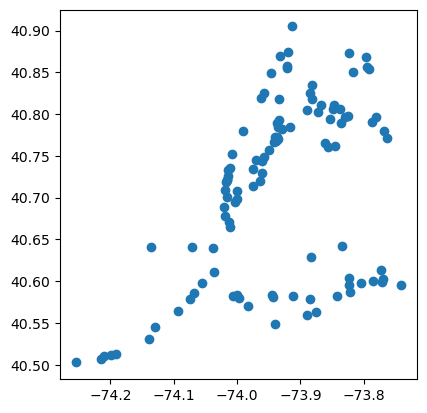

In [13]:
fishing_sites.plot()

In [14]:
(
    fishing_sites
    .explore(
        tiles='CartoDB Positron'
    )
)


Save an interactive map as standalone html with the `.save()` method 

In [15]:
!mkdir "../Maps"

In [16]:
m = (
    fishing_sites
    .explore(
        tiles='CartoDB Positron',
        tooltip=[
            'Site',
            'Ownership',
            'Link'
        ]
    )
)

m.save('../Maps/fishing-sites-map.html')

In [17]:
(
    neighborhood_tabulation_areas
    .explore(
        tiles='CartoDB Dark Matter no_labels',
        color='orange'
    )
)

### Turn `latitude` and `longitude` columns into `geometry`

NYC Parks publishes locations of basketball courts:

In [18]:
basketball_courts = pd.read_json('https://www.nycgovparks.org/bigapps/DPR_Basketball_001.json')

In [19]:
basketball_courts

,Prop_ID,Name,Location,Num_of_Courts,Accessible,lat,lon
0,X159,Captain William Harry Thompson Playground,E 174 St. & Bronx River Ave.,NaN,N,40.8342,-73.8775
1,X179,52 Playground,Kelly St. & Ave. St. John,NaN,N,40.8149,-73.9021
2,X216,Abigail Adams Playground,Tinton Ave. & E 156 St.,NaN,N,40.8172,-73.9044
3,X169,Agnes Haywood Playground,Barnes Ave. & E 215 St.,NaN,N,40.8804,-73.8619
4,X172,Allerton Playground,Bouck & Throop Aves.,NaN,N,40.8659,-73.8503
...,...,...,...,...,...,...,...
572,R106,Bloomingdale Park,"Richmond Pkwy., West Shore Expw., Lenevar Ave....",1.0,N,40.5351,-74.2102
573,R038,Midland Playground,"Mason Ave., Midland Ave",2.0,None,40.5751,-74.0989
574,Q044,L/CPL Thomas P. Noonan Jr. Playground,"47 Ave., Greenpoint Ave. bet. 42 St. and 43 St.",3.0,None,40.7412,-73.9226
575,B060,McKinley Park,"73 St., Ft. Hamilton Pkwy., 7 Ave.",2.0,None,40.6262,-74.0166


To create a points geometry column from latitude and longitude (or other coordinate) columns, use the `gdp.points_from_xy()` constructor, inside the `gpd.GeoDataFrame` constructor

Define the coordinate reference system with the `crs=` argument. (This should usually by `4326` for latitude and longitude values in degrees)

In [20]:
basketball_courts_geo = gpd.GeoDataFrame(
    data=basketball_courts,
    geometry=gpd.points_from_xy(
        basketball_courts['lon'],
        basketball_courts['lat']
    ),
    crs=4326
)

In [21]:
basketball_courts_geo

,Prop_ID,Name,Location,Num_of_Courts,Accessible,lat,lon,geometry
0,X159,Captain William Harry Thompson Playground,E 174 St. & Bronx River Ave.,NaN,N,40.8342,-73.8775,POINT (-73.8775 40.8342)
1,X179,52 Playground,Kelly St. & Ave. St. John,NaN,N,40.8149,-73.9021,POINT (-73.9021 40.8149)
2,X216,Abigail Adams Playground,Tinton Ave. & E 156 St.,NaN,N,40.8172,-73.9044,POINT (-73.9044 40.8172)
3,X169,Agnes Haywood Playground,Barnes Ave. & E 215 St.,NaN,N,40.8804,-73.8619,POINT (-73.8619 40.8804)
4,X172,Allerton Playground,Bouck & Throop Aves.,NaN,N,40.8659,-73.8503,POINT (-73.8503 40.8659)
...,...,...,...,...,...,...,...,...
572,R106,Bloomingdale Park,"Richmond Pkwy., West Shore Expw., Lenevar Ave....",1.0,N,40.5351,-74.2102,POINT (-74.2102 40.5351)
573,R038,Midland Playground,"Mason Ave., Midland Ave",2.0,None,40.5751,-74.0989,POINT (-74.0989 40.5751)
574,Q044,L/CPL Thomas P. Noonan Jr. Playground,"47 Ave., Greenpoint Ave. bet. 42 St. and 43 St.",3.0,None,40.7412,-73.9226,POINT (-73.9226 40.7412)
575,B060,McKinley Park,"73 St., Ft. Hamilton Pkwy., 7 Ave.",2.0,None,40.6262,-74.0166,POINT (-74.0166 40.6262)


In [22]:
(
    basketball_courts_geo
    .explore()
)

Something is off with some of these points...

Switch all the `lon` values to negative values then try again.

In [23]:
basketball_courts['lon'] = basketball_courts['lon'].apply(abs) * -1

In [24]:
basketball_courts_geo = gpd.GeoDataFrame(
    data=basketball_courts,
    geometry=gpd.points_from_xy(
        basketball_courts['lon'],
        basketball_courts['lat']
    ),
    crs=4326
)

In [25]:
(
    basketball_courts_geo
    .explore(
        tiles='CartoDB Positron'
    )
)

In [26]:
basketball_courts

,Prop_ID,Name,Location,Num_of_Courts,Accessible,lat,lon
0,X159,Captain William Harry Thompson Playground,E 174 St. & Bronx River Ave.,NaN,N,40.8342,-73.8775
1,X179,52 Playground,Kelly St. & Ave. St. John,NaN,N,40.8149,-73.9021
2,X216,Abigail Adams Playground,Tinton Ave. & E 156 St.,NaN,N,40.8172,-73.9044
3,X169,Agnes Haywood Playground,Barnes Ave. & E 215 St.,NaN,N,40.8804,-73.8619
4,X172,Allerton Playground,Bouck & Throop Aves.,NaN,N,40.8659,-73.8503
...,...,...,...,...,...,...,...
572,R106,Bloomingdale Park,"Richmond Pkwy., West Shore Expw., Lenevar Ave....",1.0,N,40.5351,-74.2102
573,R038,Midland Playground,"Mason Ave., Midland Ave",2.0,None,40.5751,-74.0989
574,Q044,L/CPL Thomas P. Noonan Jr. Playground,"47 Ave., Greenpoint Ave. bet. 42 St. and 43 St.",3.0,None,40.7412,-73.9226
575,B060,McKinley Park,"73 St., Ft. Hamilton Pkwy., 7 Ave.",2.0,None,40.6262,-74.0166


### Reprojection

latitude and longitude are geographic references. For urban planning-scale analysis, projected planar coordinates are often more useful: 
- orthogonal x and y directions
- units it meters or feet
- accurate distances and areas.


For work in New York City, there are two magic number EPSG codes to remember:
- **4326** is the code for geographic, lat/lon reference (anywhere in the world)
- **2263** is the code for the local projected reference for NYC, with X and Y in feet

In [27]:
basketball_courts_geo

,Prop_ID,Name,Location,Num_of_Courts,Accessible,lat,lon,geometry
0,X159,Captain William Harry Thompson Playground,E 174 St. & Bronx River Ave.,NaN,N,40.8342,-73.8775,POINT (-73.8775 40.8342)
1,X179,52 Playground,Kelly St. & Ave. St. John,NaN,N,40.8149,-73.9021,POINT (-73.9021 40.8149)
2,X216,Abigail Adams Playground,Tinton Ave. & E 156 St.,NaN,N,40.8172,-73.9044,POINT (-73.9044 40.8172)
3,X169,Agnes Haywood Playground,Barnes Ave. & E 215 St.,NaN,N,40.8804,-73.8619,POINT (-73.8619 40.8804)
4,X172,Allerton Playground,Bouck & Throop Aves.,NaN,N,40.8659,-73.8503,POINT (-73.8503 40.8659)
...,...,...,...,...,...,...,...,...
572,R106,Bloomingdale Park,"Richmond Pkwy., West Shore Expw., Lenevar Ave....",1.0,N,40.5351,-74.2102,POINT (-74.2102 40.5351)
573,R038,Midland Playground,"Mason Ave., Midland Ave",2.0,None,40.5751,-74.0989,POINT (-74.0989 40.5751)
574,Q044,L/CPL Thomas P. Noonan Jr. Playground,"47 Ave., Greenpoint Ave. bet. 42 St. and 43 St.",3.0,None,40.7412,-73.9226,POINT (-73.9226 40.7412)
575,B060,McKinley Park,"73 St., Ft. Hamilton Pkwy., 7 Ave.",2.0,None,40.6262,-74.0166,POINT (-74.0166 40.6262)


In [28]:
basketball_courts_geo.to_crs(2263)

,Prop_ID,Name,Location,Num_of_Courts,Accessible,lat,lon,geometry
0,X159,Captain William Harry Thompson Playground,E 174 St. & Bronx River Ave.,NaN,N,40.8342,-73.8775,POINT (1018148.502 243222.757)
1,X179,52 Playground,Kelly St. & Ave. St. John,NaN,N,40.8149,-73.9021,POINT (1011348.959 236182.529)
2,X216,Abigail Adams Playground,Tinton Ave. & E 156 St.,NaN,N,40.8172,-73.9044,POINT (1010711.398 237019.794)
3,X169,Agnes Haywood Playground,Barnes Ave. & E 215 St.,NaN,N,40.8804,-73.8619,POINT (1022438.834 260061.575)
4,X172,Allerton Playground,Bouck & Throop Aves.,NaN,N,40.8659,-73.8503,POINT (1025655.62 254783.945)
...,...,...,...,...,...,...,...,...
572,R106,Bloomingdale Park,"Richmond Pkwy., West Shore Expw., Lenevar Ave....",1.0,N,40.5351,-74.2102,POINT (925821.627 134298.089)
573,R038,Midland Playground,"Mason Ave., Midland Ave",2.0,None,40.5751,-74.0989,POINT (956775.635 148816.45)
574,Q044,L/CPL Thomas P. Noonan Jr. Playground,"47 Ave., Greenpoint Ave. bet. 42 St. and 43 St.",3.0,None,40.7412,-73.9226,POINT (1005698.228 209325.492)
575,B060,McKinley Park,"73 St., Ft. Hamilton Pkwy., 7 Ave.",2.0,None,40.6262,-74.0166,POINT (979642.06 167418.46)


In [29]:
neighborhood_tabulation_areas = neighborhood_tabulation_areas.to_crs(2263)
basketball_courts_geo = basketball_courts_geo.to_crs(2263)

### Spatial join

Check for matching coordinate reference systems

In [30]:
neighborhood_tabulation_areas.crs == basketball_courts_geo.crs

True

In [31]:
basketball_courts_ntas = (
    basketball_courts_geo
    .sjoin(
        neighborhood_tabulation_areas,
        how='left'
    )
)

basketball_courts_ntas

,Prop_ID,Name,Location,Num_of_Courts,Accessible,lat,lon,geometry,index_right,OBJECTID,...,BoroName,CountyFIPS,NTA2020,NTAName,NTAAbbrev,NTAType,CDTA2020,CDTAName,Shape__Area,Shape__Length
0,X159,Captain William Harry Thompson Playground,E 174 St. & Bronx River Ave.,NaN,N,40.8342,-73.8775,POINT (1018148.502 243222.757),95.0,96.0,...,Bronx,005,BX0901,Soundview-Bruckner-Bronx River,Sdvw_BxRvr,0,BX09,BX09 Soundview-Parkchester (CD 9 Approximation),3.220801e+07,26836.619889
1,X179,52 Playground,Kelly St. & Ave. St. John,NaN,N,40.8149,-73.9021,POINT (1011348.959 236182.529),72.0,73.0,...,Bronx,005,BX0202,Longwood,Lngwd,0,BX02,BX02 Longwood-Hunts Point (CD 2 Approximation),1.539891e+07,21722.406528
2,X216,Abigail Adams Playground,Tinton Ave. & E 156 St.,NaN,N,40.8172,-73.9044,POINT (1010711.398 237019.794),70.0,71.0,...,Bronx,005,BX0102,Melrose,Mlrs,0,BX01,BX01 Melrose-Mott Haven-Port Morris (CD 1 Appr...,1.727176e+07,19589.195713
3,X169,Agnes Haywood Playground,Barnes Ave. & E 215 St.,NaN,N,40.8804,-73.8619,POINT (1022438.834 260061.575),111.0,112.0,...,Bronx,005,BX1201,Williamsbridge-Olinville,Wllmsbrdg,0,BX12,BX12 Wakefield-Williamsbridge-Eastchester (CD ...,3.624229e+07,29370.819994
4,X172,Allerton Playground,Bouck & Throop Aves.,NaN,N,40.8659,-73.8503,POINT (1025655.62 254783.945),108.0,109.0,...,Bronx,005,BX1103,Pelham Gardens,PlhmGrdns,0,BX11,BX11 Pelham Parkway-Morris Park (CD 11 Approxi...,3.006418e+07,24342.895642
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
572,R106,Bloomingdale Park,"Richmond Pkwy., West Shore Expw., Lenevar Ave....",1.0,N,40.5351,-74.2102,POINT (925821.627 134298.089),255.0,256.0,...,Staten Island,085,SI0304,Annadale-Huguenot-Prince's Bay-Woodrow,Anndl_Wdrw,0,SI03,SI03 South Shore (CD 3 Approximation),1.804263e+08,67585.545111
573,R038,Midland Playground,"Mason Ave., Midland Ave",2.0,None,40.5751,-74.0989,POINT (956775.635 148816.45),248.0,249.0,...,Staten Island,085,SI0202,New Dorp-Midland Beach,NwDrp_MBch,0,SI02,SI02 Mid-Island (CD 2 Approximation),6.218263e+07,49753.473599
574,Q044,L/CPL Thomas P. Noonan Jr. Playground,"47 Ave., Greenpoint Ave. bet. 42 St. and 43 St.",3.0,None,40.7412,-73.9226,POINT (1005698.228 209325.492),166.0,167.0,...,Queens,081,QN0202,Sunnyside,Snnysd,0,QN02,QN02 Long Island City-Sunnyside-Woodside (CD 2...,4.770172e+07,34952.155339
575,B060,McKinley Park,"73 St., Ft. Hamilton Pkwy., 7 Ave.",2.0,None,40.6262,-74.0166,POINT (979642.06 167418.46),32.0,33.0,...,Brooklyn,047,BK1002,Dyker Heights,DykrHts,0,BK10,BK10 Bay Ridge-Dyker Heights (CD 10 Approximat...,2.911907e+07,25001.489988


In [32]:
(
    basketball_courts_ntas
    ['NTAName']
    .value_counts()
    .head(10)
)

NTAName
Harlem (North)               12
Bedford-Stuyvesant (East)    11
Lower East Side              11
Mott Haven-Port Morris        9
East Harlem (North)           9
Forest Hills                  8
Brownsville                   8
Williamsburg                  8
Fort Greene                   7
East Williamsburg             7
Name: count, dtype: int64

#### Summarize, join, and map workflow:

In [33]:
count_court_locations_by_nta = (
    basketball_courts_ntas
    .groupby('NTA2020')
    ['Prop_ID']
    .nunique()
    .rename('count_court_locations')
)

count_court_locations_by_nta

NTA2020
BK0101    2
BK0102    7
BK0103    4
BK0104    7
BK0202    3
         ..
SI0204    1
SI0301    2
SI0302    3
SI0304    3
SI9592    1
Name: count_court_locations, Length: 187, dtype: int64

In [34]:
nta_count_court_locations = (
    neighborhood_tabulation_areas
    .merge(
        count_court_locations_by_nta,
        left_on='NTA2020',
        right_index=True,
        how='left',
        validate='1:1'
    )
)

In [35]:
nta_count_court_locations['count_court_locations'] = nta_count_court_locations['count_court_locations'].fillna(0)

(905464.5452042153, 1075092.5349105534, 112495.66013757516, 280483.2556677982)

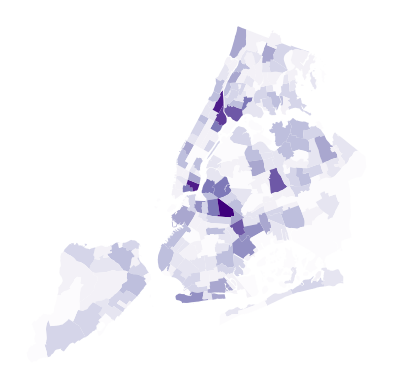

In [36]:
(
    nta_count_court_locations
    .plot(
        column='count_court_locations',
        cmap='Purples'
    )
)

plt.axis('off')

In [37]:
(
    nta_count_court_locations
    .sort_values('count_court_locations')
    .explore(
        column='count_court_locations',
        cmap='Purples',
        tiles='CartoDB Positron no_labels'
    )
)

### Colors

Named colormaps are listed here: https://matplotlib.org/stable/users/explain/colors/colormaps.html.

Choose an appropriate color map for the data: 
- Sequential are best for data that ranges from low (especially from zero) to high.
- Diverging are best for data which have high and low extremes, and neutral or near-zero values in the center.
- Above a basemap, the paler ends of these colormaps may be less visible. A perceptually-uniform colormap like `plasma` or two-color sequential like `cool` or `spring` may be easier to see. Flip the colormap (by using the optional reversed variant with `_r`, e.g. `plasma_r`) so it is oriented in a way that color and saturation match intuitively with the direction of the data.

For qualitative data, where there is no meaningful ordering, use a qualitative colormap and include the option `categorical=True` in explore:

In [38]:
(
    fishing_sites
    .explore(
        tiles='cartodb positron',
        column='Ownership',
        cmap='tab20b'
    )
)

### Additional spatial methods

In [39]:
(
    basketball_courts_geo
    .buffer(1500)
)

0      POLYGON ((1019648.502 243222.757, 1019641.279 ...
1      POLYGON ((1012848.959 236182.529, 1012841.736 ...
2      POLYGON ((1012211.398 237019.794, 1012204.175 ...
3      POLYGON ((1023938.834 260061.575, 1023931.611 ...
4      POLYGON ((1027155.62 254783.945, 1027148.397 2...
                             ...                        
572    POLYGON ((927321.627 134298.089, 927314.404 13...
573    POLYGON ((958275.635 148816.45, 958268.412 148...
574    POLYGON ((1007198.228 209325.492, 1007191.005 ...
575    POLYGON ((981142.06 167418.46, 981134.837 1672...
576    POLYGON ((1007021.287 221494.039, 1007014.064 ...
Length: 577, dtype: geometry

In [40]:
basketball_courts_buffer = (
    basketball_courts_geo
    .assign(
        geometry = basketball_courts_geo.buffer(1500)
    )
)

In [41]:
basketball_courts_buffer.explore()

In [42]:
neighborhood_tabulation_areas.centroid

0        POINT (998241.497 205060.18)
1       POINT (995720.468 199744.889)
2        POINT (996266.692 195492.69)
3      POINT (1001856.746 199160.335)
4       POINT (985683.218 192656.439)
                    ...              
257      POINT (929350.33 146306.451)
258     POINT (967995.505 158433.937)
259     POINT (969487.436 149223.657)
260     POINT (957215.858 146498.841)
261     POINT (948579.873 138147.474)
Length: 262, dtype: geometry

In [43]:
nta_centroid = (
    neighborhood_tabulation_areas
    .assign(
        geometry = neighborhood_tabulation_areas.centroid
    )
)

Layer maps with `.explore()` by assigning the first layer map object to a variable (`m` is a standard name) and passing this object name to the `m=` argument of subsequent layers:

In [53]:
m = (
        neighborhood_tabulation_areas
        .explore(
            tiles='cartodb positron',
            color='lightgrey'
        )
)

nta_centroid.explore(m=m)


m


In [45]:
(
    neighborhood_tabulation_areas.area
)

0      3.532169e+07
1      2.885398e+07
2      1.520902e+07
3      5.226787e+07
4      9.982603e+06
           ...     
257    4.775789e+07
258    9.867026e+06
259    6.357024e+05
260    1.086680e+07
261    2.338152e+07
Length: 262, dtype: float64

In [46]:
neighborhood_tabulation_areas

,OBJECTID,BoroCode,BoroName,CountyFIPS,NTA2020,NTAName,NTAAbbrev,NTAType,CDTA2020,CDTAName,Shape__Area,Shape__Length,geometry
0,1,3,Brooklyn,047,BK0101,Greenpoint,Grnpt,0,BK01,BK01 Williamsburg-Greenpoint (CD 1 Equivalent),3.532181e+07,28919.562151,"POLYGON ((1003059.563 204575.269, 1002990.933 ..."
1,2,3,Brooklyn,047,BK0102,Williamsburg,Wllmsbrg,0,BK01,BK01 Williamsburg-Greenpoint (CD 1 Equivalent),2.885431e+07,28098.026805,"POLYGON ((995851.474 203202.553, 995968.751 20..."
2,3,3,Brooklyn,047,BK0103,South Williamsburg,SWllmsbrg,0,BK01,BK01 Williamsburg-Greenpoint (CD 1 Equivalent),1.520896e+07,18250.280306,"POLYGON ((998046.785 196306.536, 998157.477 19..."
3,4,3,Brooklyn,047,BK0104,East Williamsburg,EWllmsbrg,0,BK01,BK01 Williamsburg-Greenpoint (CD 1 Equivalent),5.226741e+07,43184.799309,"POLYGON ((1005302.076 199458.967, 1005307.372 ..."
4,5,3,Brooklyn,047,BK0201,Brooklyn Heights,BkHts,0,BK02,BK02 Downtown Brooklyn-Fort Greene (CD 2 Appro...,9.982321e+06,14312.505244,"POLYGON ((986367.305 190552.406, 985813.404 19..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
257,258,5,Staten Island,085,SI0391,Freshkills Park (South),FrshklPK_S,9,SI03,SI03 South Shore (CD 3 Approximation),4.775877e+07,33945.420292,"POLYGON ((928531.122 150474.757, 929005.338 15..."
258,259,5,Staten Island,085,SI9561,Fort Wadsworth,FtWdswrth,6,SI95,SI95 Great Kills Park-Fort Wadsworth (JIA 95 A...,9.867249e+06,14814.414469,"POLYGON ((967656.477 155640.199, 967549.276 15..."
259,260,5,Staten Island,085,SI9591,Hoffman & Swinburne Islands,HffmnIsl,9,SI95,SI95 Great Kills Park-Fort Wadsworth (JIA 95 A...,6.357020e+05,4743.128127,"MULTIPOLYGON (((969487.828 149756.655, 969232...."
260,261,5,Staten Island,085,SI9592,Miller Field,MllrFld,9,SI95,SI95 Great Kills Park-Fort Wadsworth (JIA 95 A...,1.086680e+07,19197.201083,"POLYGON ((960721.284 147495.696, 960370.201 14..."


In [47]:
(
    neighborhood_tabulation_areas
    .dissolve(
        'CDTAName',
        aggfunc={
            'NTAName':lambda names: ', '.join(names)
        }
    )
    .explore(tiles='cartodb positron')
)

### Saving spatial data

In [48]:
!mkdir "../Data/Processed Data"

In [49]:
basketball_courts_buffer.to_file('../Data/Processed Data/basketball_courts_buffer.geojson')

In [50]:
basketball_courts_buffer.to_file('../Data/Processed Data/basketball_courts_buffer.shp')

/var/folders/g7/v_7ql1m975bc_gyw_57lw50c0000gn/T/ipykernel_6660/825354317.py:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  basketball_courts_buffer.to_file('../Data/Processed Data/basketball_courts_buffer.shp')
/opt/anaconda3/envs/urban-data-analysis/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Num_of_Courts' to 'Num_of_Cou'
  ogr_write(


# Tasks

1. Which city council district has the most basketball counts?

In [51]:
council_districts = gpd.read_file('https://services5.arcgis.com/GfwWNkhOj9bNBqoJ/arcgis/rest/services/NYC_City_Council_Districts/FeatureServer/0/query?where=1=1&outFields=*&outSR=4326&f=pgeojson')